In [ ]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pickle
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
from yellowbrick.cluster import KElbowVisualizer

In [ ]:
# import csv files. 
# Note: plz change the file name according to the where the csv file is stored
df = pd.read_csv("/content/drive/MyDrive/Data for 403 projects/Data_For_Plotting_Maps.csv")

In [ ]:
# interactive maps are created here.
# the points are plotted from the dataframe using latitude and logitude.
# hover name tells the street name.
# hover data gives what kind of wastetype, and land and size from the data are.
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", hover_name="AddressLine1", hover_data=["WasteType", "Land", "Size"],
                        color_discrete_sequence=["red"], zoom=3, height=1000)
# mapbox style tells to plot on the worldname.
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# plot the final plot.
fig.show()

In [ ]:
# create a model of the above map for future use.
pickle.dump(fig, open('FigureObject1.fig.pickle', 'wb'))

In [ ]:
# now clustering is attemped
# a new dataframe is created X which only has Latitude, and Longitude
X = df.loc[:,['Latitude','Longitude']]

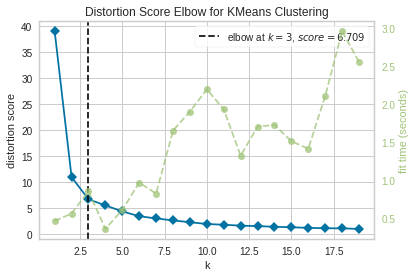

In [ ]:
# kmeans algorithm is used for clustering.
# a model has been initailized.
model = KMeans()
# for a range of 1 to 20, find the best k value.
# we can see the graph tell that the ideal k value should be 3.
visualizer = KElbowVisualizer(model, k=(1,20)).fit(X)
visualizer.show()

In [ ]:
# id_n is basically k value found from the above plot.
id_n=3
# we fit the X dataframe for the kmeans algorithm with k=3.
kmeans = KMeans(n_clusters=id_n, random_state=0).fit(X)
# store the labels found out by the kmeans model.
id_label=kmeans.labels_

In [ ]:
# add a new column clusters to X to store the store the value of labels.
X["Clusters"] = id_label
# add a new column Ward which is same as WardCode from the original data to X.
# any required column from main data can be added to X. We chose WardCode.
X["Ward"] = df["WardCode"]

In [ ]:
# X look like this now.
print(X)

        Latitude  Longitude  Clusters Ward
0      53.967858  -2.776991         1  ELL
1      54.062851  -2.882551         0  HEN
2      54.071808  -2.868269         0  POL
3      54.072145  -2.867619         0  POL
4      54.071245  -2.867784         0  POL
...          ...        ...       ...  ...
17729  54.060198  -2.797887         1  SKE
17730  54.084004  -2.740668         2  HAL
17731  54.045524  -2.818712         1  CAS
17732  54.059142  -2.786287         1  BLK
17733  54.052468  -2.792469         1  BLK

[17734 rows x 4 columns]


In [ ]:
# plot again just like above.
# the only difference is the data used and the data is now coloured according
# to the clustered formed.
fig = px.scatter_mapbox(X, lat="Latitude", lon="Longitude", hover_data=["Ward", df["AddressLine1"], df["AddressLine2"]], zoom=3, height=1000, color="Clusters", color_continuous_scale=px.colors.sequential.Bluered)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# save the plot.
pickle.dump(fig, open('FigureObject2.fig.pickle', 'wb'))

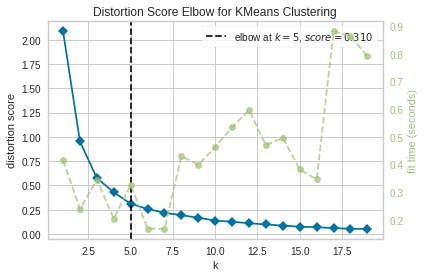

In [ ]:
# clusteres within a clusters are formed. 
# so for examples 0 cluster which is for morecambe.
# any area can be chosen as per requirement.
# a new dataframe test is created
test = pd.DataFrame()
# only rows with cluster 0 is stored.
test = X[X['Clusters'] == 0]
test.drop(['Clusters'], axis=1)
X = test.loc[:,['Latitude','Longitude']]
# a new model is fitted again.
# find the ideal value for k as done above.
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,20)).fit(X)
visualizer.show()

In [ ]:
# from the plot above k=5 is the ideal value.
id_n=5
# a new model with k=5 is created
kmeans = KMeans(n_clusters=id_n, random_state=0).fit(X)
# the clusters are stored.
id_label=kmeans.labels_

In [ ]:
# again same process is repeated.
X["Clusters"] = id_label
X["Ward"] = test["Ward"]

In [ ]:
# a new plot shows the clusters in morecambe. 
fig = px.scatter_mapbox(X, lat="Latitude", lon="Longitude", hover_data=["Ward"], zoom=3, height=1000, color="Clusters", color_continuous_scale=px.colors.sequential.Bluered)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# the plot is saved.
pickle.dump(fig, open('FigureObject3.fig.pickle', 'wb'))

# To use the saved interactive maps use the below code.
# Change the figure name as per need.
# You can use the code segment without all the processes done above.

In [ ]:
# import pickle
import pickle

# create a new variable storing the maps.
figx = pickle.load(open('FigureObject1.fig.pickle', 'rb'))

# plot the maps
figx.show() 